In [1]:
import os
import pandas as pd
import numpy as np
import re
import pdfminer.high_level
import wordcloud
from stop_words import get_stop_words
import matplotlib.pyplot as plt

plt.style.use("ggplot")

%load_ext jupyter_black

In [2]:
stop_words_fr = get_stop_words("fr")
stop_words_en = get_stop_words("en")
stop_words = stop_words_fr  # + stop_words_en

In [3]:
list_files = os.listdir("Rapports")
len(list_files)

69

In [4]:
file = list_files[0]
file

'avis_conseil_scientifique_16_mars_2020.pdf'

# Data

## Get data

In [4]:
dict_month = {
    "janvier": 1,
    "fevrier": 2,
    "mars": 3,
    "avril": 4,
    "mai": 5,
    "juin": 6,
    "juillet": 7,
    "aout": 8,
    "septembre": 9,
    "octobre": 10,
    "novembre": 11,
    "decembre": 12,
}


def get_date(doc_txt):
    year = re.search("[0-9]{4}", doc_txt)[0]
    date_str = (
        doc_txt.split(year)[0].lower().replace("covid-19", "").replace("version 2", "")
    )
    day = re.search("\d{1,2}", date_str)[0]
    month = date_str.split(day)[1].strip().lower()
    month = month.replace("é", "e").replace("û", "u")
    if not month in dict_month:
        month = month.split("à")[0].strip()
    date = pd.to_datetime(
        day + "-" + str(dict_month[month]) + "-" + year, dayfirst=True
    )
    return date


def get_title(doc_txt, date, file):
    match file:
        case "283221.pdf":
            title = "VERSION RÉVISÉE DU 23 DÉCEMBRE 17H30 \n\n6ème VAGUE LIEE AU VARIANT OMICRON"

        case "279091.pdf":
            title = "POINT DE SITUATION SUR LES VARIANTS \nMODELISATIONS \nPERSPECTIVES POUR LE MOIS DE MARS"
        case "277471.pdf":
            title = "DISPONIBILITE DES TESTS RAPIDES : DEFINIR UNE STRATEGIE DE TESTS"
        case "279078.pdf":
            title = "VACCINS CONTRE LE SARS-CoV-2, UNE STRATEGIE DE VACCINATION"
        case "274444.pdf":
            title = "SCENARIOS POUR LA PERIODE POST-CONFINEMENT ANTICIPER POUR MIEUX PROTEGER"
        case "avis_conseil_scientifique_23_mars_2020.pdf":
            title = "Avis du Conseil scientifique"
        case _:
            title = (
                doc_txt.split("Conseil scientifique COVID-19")[1]
                .split("Membres")[0]
                .split(str(date.year))[1]
            )
    title = title.replace("\n", " ")
    title = re.sub(" +", " ", title)
    title = title.encode("utf8", errors="ignore").decode()  # "ascii"
    title = title.replace("\uf0b7", "\n")
    title = title.strip().capitalize()
    if "La 5ème vague liee aux variants omicron n’est pas terminee, " in title:
        title = "5eme vague"
    return title

In [5]:
df = pd.DataFrame()
df["File"] = list_files
df.head()

,File
0,avis_conseil_scientifique_16_mars_2020.pdf
1,285769.pdf
2,285587.pdf
3,284452.pdf
4,284119.pdf


In [6]:
def get_text(file):
    doc_txt = pdfminer.high_level.extract_text(f"Rapports/{file}")
    return doc_txt

In [7]:
if False:  # takes 3 minutes to run
    df["Text"] = df.File.apply(get_text)
    df.to_pickle("data/df_with_text_only.pkl")
    df.head()

In [8]:
df = pd.read_pickle("data/df_with_text_only.pkl")
df.head()

,File,Text
0,avis_conseil_scientifique_16_mars_2020.pdf,"A Paris, le 16 mars 2020, 17h \n\nAvis du Cons..."
1,285769.pdf,"19 JUILLET 2022, 13H00 \n\nAvis du Conseil sci..."
2,285587.pdf,"23 JUIN 2022, 15H00 \n\nAvis du Conseil scient..."
3,284452.pdf,"11 MARS 2022, 18H30 \nVERSION ACTUALI..."
4,284119.pdf,"14 FEVRIER 2022, 18H30 \n\nAvis du Conseil sci..."


In [9]:
df["Date"] = df.Text.apply(get_date)
df.head()

,File,Text,Date
0,avis_conseil_scientifique_16_mars_2020.pdf,"A Paris, le 16 mars 2020, 17h \n\nAvis du Cons...",2020-03-16
1,285769.pdf,"19 JUILLET 2022, 13H00 \n\nAvis du Conseil sci...",2022-07-19
2,285587.pdf,"23 JUIN 2022, 15H00 \n\nAvis du Conseil scient...",2022-06-23
3,284452.pdf,"11 MARS 2022, 18H30 \nVERSION ACTUALI...",2022-03-11
4,284119.pdf,"14 FEVRIER 2022, 18H30 \n\nAvis du Conseil sci...",2022-02-14


In [10]:
df["Title"] = df.apply(
    lambda x: get_title(doc_txt=x.Text, date=x.Date, file=x.File), axis=1
)
df.head()

,File,Text,Date,Title
0,avis_conseil_scientifique_16_mars_2020.pdf,"A Paris, le 16 mars 2020, 17h \n\nAvis du Cons...",2020-03-16,
1,285769.pdf,"19 JUILLET 2022, 13H00 \n\nAvis du Conseil sci...",2022-07-19,Vivre avec les variants \n la pandemie n’est p...
2,285587.pdf,"23 JUIN 2022, 15H00 \n\nAvis du Conseil scient...",2022-06-23,Projet de loi maintenant provisoirement un dis...
3,284452.pdf,"11 MARS 2022, 18H30 \nVERSION ACTUALI...",2022-03-11,5eme vague
4,284119.pdf,"14 FEVRIER 2022, 18H30 \n\nAvis du Conseil sci...",2022-02-14,Decret portant modification des conditions de ...


In [11]:
def get_authors(doc_txt, file):
    president_name = "Jean-François Delfraissy, Président"
    if president_name in doc_txt:
        authors = doc_txt.split(president_name)[1].strip().split("\n\n")[0]
        authors = (
            authors.replace("\nXX mai 2020", "")
            .replace("\nANTICIPER POUR MIEUX PROTEGER", "")
            .replace("\n1.", "")
            .replace("DES SCENARIOSAvis 7 du Conseil scientifique COVID-19 ", "")
            .replace("\nSCENARIOS POUR LA PERIODE POST-CONFINEMENT ", "")
        )
        authors = authors.strip()
        authors = (
            authors.replace("ë", "e")
            .replace("Pierre Louis", "Pierre-Louis")
            .replace("Atlani Duault", "Atlani-Duault")
            .replace("Yazdanapanah", "Yazdanpanah")
        )
        authors = president_name + "\n" + authors
        match file:
            case "279078.pdf":
                authors = []
            case _:
                authors = [
                    (authors.split(",")[0].strip(), authors.split(",")[1].strip())
                    for authors in authors.split("\n")
                ]

    else:
        authors = []

    return authors

In [12]:
df["Authors"] = df.apply(lambda x: get_authors(x.Text, x.File), axis=1)

In [13]:
def rename_jobs(job):
    job = str(job)
    if "nouvelles technologies" in [
        "Spécialiste des nouvelles technologies",
        "Spécialiste du numérique",
    ]:
        job = "Expert en numérique"
    if "santé publique" in job.lower():
        job = "Santé Publique"
    if "(excusé)" in job:
        job = job.replace("(excusé)", "").strip()
    if "*" in job:
        job = job.split("*")[0].strip()

    return job

In [14]:
df_authors = df.explode(column="Authors")
df_authors["Author_name"] = df_authors.Authors.apply(
    lambda x: x[0] if type(x) == tuple else np.nan
)
df_authors["Author_job"] = df_authors.Authors.apply(
    lambda x: x[1] if type(x) == tuple else np.nan
)
df_authors["Author_job"] = df_authors.Author_job.apply(rename_jobs)
df_authors["count"] = 1
df_authors = df_authors.pivot_table(
    index="Date", columns=["Author_name", "Author_job"], values="count"
).fillna(0)
df_authors.head()

Author_name Angèle Consoli Arnaud Fontanet       Aymeril Hoang  \
Author_job  Pédopsychiatre Epidémiologiste Expert en numérique   
Date                                                             
2020-03-12             0.0             1.0                 0.0   
2020-03-14             0.0             1.0                 0.0   
2020-03-16             0.0             1.0                 0.0   
2020-03-23             0.0             1.0                 0.0   
2020-04-02             0.0             1.0                 0.0   

Author_name                                                                  \
Author_job  Spécialiste des nouvelles technologies Spécialiste du numérique   
Date                                                                          
2020-03-12                                     0.0                      0.0   
2020-03-14                                     0.0                      0.0   
2020-03-16                                     0.0                      0.0   
2020-03-23                                     0.0                      0.0   
2020-04-02                                     0.0                      0.0   

Author_name Bruno Lina Catherine Chirouze Daniel Benamouzig   Denis Malvy  \
Author_job   Virologue      Infectiologue        Sociologue Infectiologue   
Date                                                                        
2020-03-12         1.0                0.0               1.0           1.0   
2020-03-14         1.0                0.0               1.0           1.0   
2020-03-16         1.0                0.0               1.0           1.0   
2020-03-23         1.0                0.0               1.0           1.0   
2020-04-02         1.0                0.0               1.0           1.0   

Author_name Didier Raoult  ... Jean-François Delfraissy Jean-Laurent Casanova  \
Author_job  Infectiologue  ...                Président Immunologie/Pédiatrie   
Date                       ...                                                  
2020-03-12            1.0  ...                      1.0                   0.0   
2020-03-14            1.0  ...                      1.0                   0.0   
2020-03-16            0.0  ...                      1.0                   0.0   
2020-03-23            0.0  ...                      1.0                   0.0   
2020-04-02            0.0  ...                      1.0                   1.0   

Author_name Laetitia Atlani-Duault Lila Bouadma Marie-Aleth Grard  \
Author_job           Anthropologue Réanimatrice Milieu associatif   
Date                                                                
2020-03-12                     1.0          1.0               0.0   
2020-03-14                     1.0          1.0               0.0   
2020-03-16                     1.0          1.0               0.0   
2020-03-23                     1.0          1.0               0.0   
2020-04-02                     1.0          1.0               1.0   

Author_name Olivier Guérin Pierre-Louis Druais Simon Cauchemez  \
Author_job        Gériatre   Médecine de Ville    Modélisateur   
Date                                                             
2020-03-12             0.0                 1.0             1.0   
2020-03-14             0.0                 1.0             1.0   
2020-03-16             0.0                 1.0             1.0   
2020-03-23             0.0                 1.0             1.0   
2020-04-02             0.0                 1.0             1.0   

Author_name     Thierry Lefrançois Yazdan Yazdanpanah  
Author_job  Vétérinaire/One Health      Infectiologue  
Date                                                   
2020-03-12                     0.0                1.0  
2020-03-14                     0.0                1.0  
2020-03-16                     0.0                1.0  
2020-03-23                     0.0                1.0  
2020-04-02                     0.0                1.0  

[5 rows x 21 columns]

In [15]:
df_authors.columns.get_level_values(1).unique()

Index(['Pédopsychiatre', 'Epidémiologiste', 'Expert en numérique',
       'Spécialiste des nouvelles technologies', 'Spécialiste du numérique',
       'Virologue', 'Infectiologue', 'Sociologue', 'Santé Publique',
       'Président', 'Immunologie/Pédiatrie', 'Anthropologue', 'Réanimatrice',
       'Milieu associatif', 'Gériatre', 'Médecine de Ville', 'Modélisateur',
       'Vétérinaire/One Health'],
      dtype='object', name='Author_job')

Text(0.5, 1.0, 'Représentation au "Conseil Scientifique"')

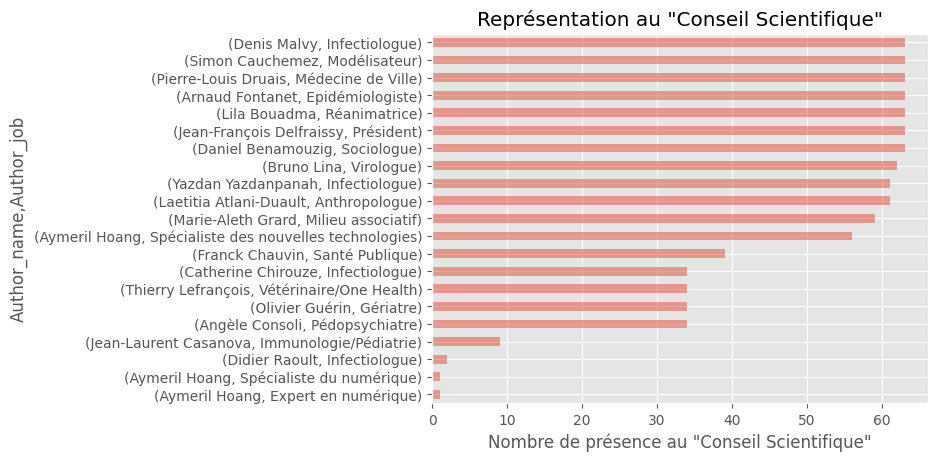

In [16]:
fig, ax = plt.subplots()
df_authors.sum().sort_values().plot(kind="barh", ax=ax, alpha=0.5)
ax.set_xlabel('Nombre de présence au "Conseil Scientifique"')
ax.set_title('Représentation au "Conseil Scientifique"')

C:\Users\romai\AppData\Local\Temp\ipykernel_12588\3577317196.py:2: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  df_authors.sum(axis=1, level=1).sum().sort_values().plot(kind="barh", ax=ax, alpha=0.6)


Text(0.5, 1.0, 'Représentation au "Conseil Scientifique"')

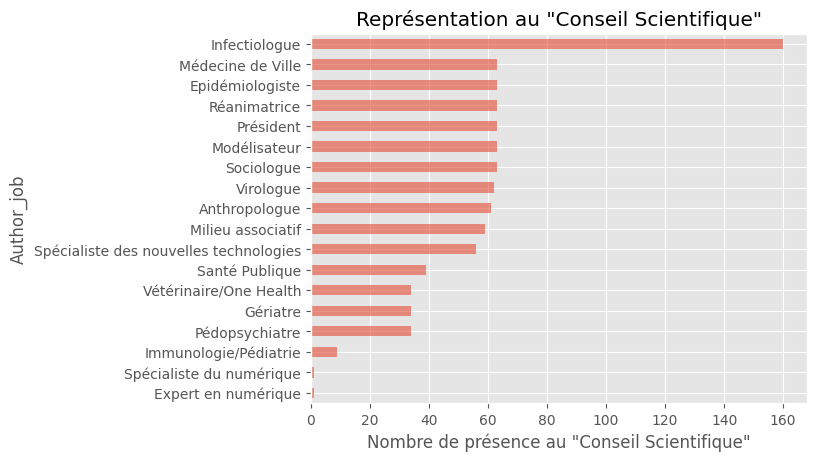

In [17]:
fig, ax = plt.subplots()
df_authors.sum(axis=1, level=1).sum().sort_values().plot(kind="barh", ax=ax, alpha=0.6)
ax.set_xlabel('Nombre de présence au "Conseil Scientifique"')
ax.set_title('Représentation au "Conseil Scientifique"')

C:\Users\romai\AppData\Local\Temp\ipykernel_12588\3322592813.py:2: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  df_authors.sum(axis=1, level=1).resample("M").mean().plot(ax=ax)


Text(0.5, 1.0, 'Evolution temporelle de la représentation au "Conseil Scientifique"')

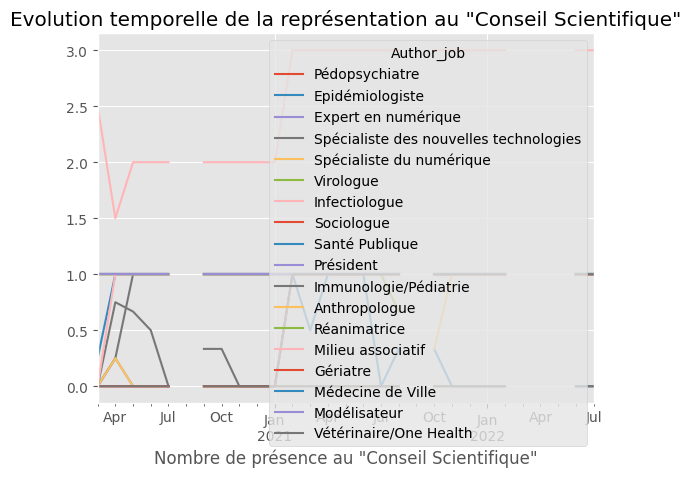

In [18]:
fig, ax = plt.subplots()
df_authors.sum(axis=1, level=1).resample("M").mean().plot(ax=ax)
ax.set_xlabel('Nombre de présence au "Conseil Scientifique"')
ax.set_title('Evolution temporelle de la représentation au "Conseil Scientifique"')

# Wordcloud

## Global wordcloud

In [133]:
txt = [txt_i for txt_i in df.Text]
txt = str(txt).replace(r"\n", " ").replace(r"uf0b7", "")
txt = re.sub("\d{1,2}h\d{2}", "", txt)
txt = re.sub("\d{1,2}H\d{2}", "", txt)

In [138]:
additional_stopwords = [
    r"Conseil scientifique",
    r"gouv fr",
    "vi",
    "jusqu",
    "https doi",
    "https www",
    "doi org",
    "x0c",
    "o",
    "i",
    "ii",
    "iii",
    "iv",
    "v",
    "vi",
    "A",
    "B",
    "C",
    "D",
    "afin",
    "and",
    "ainsi",
    "al",
    "s",
    "ca",
    "plu",
    "plus",
    "vis",
    "H",
    "celle",
    "mi",
    "in",
    "mis",
    "chez",
    "entre",
] + list(dict_month.keys())

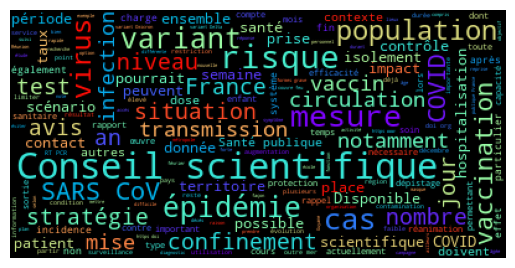

In [139]:
WC = wordcloud.WordCloud(
    stopwords=stop_words + additional_stopwords,
    background_color="black",
    colormap="rainbow",
).generate(txt)

im = WC.to_image()

fig, ax = plt.subplots()
ax.imshow(im)
ax.grid(False)
ax.axis(False)
# ax.set_title("Titre")
plt.savefig(
    "wordcloud/Conseil_Scientifique_all_reports.png", bbox_inches="tight", pad_inches=0
)

In [140]:
df_words = pd.DataFrame(index=WC.words_.keys())
df_words["score"] = data = WC.words_.values()
df_words

,score
Conseil scientifique,1.000000
risque,0.759485
mesure,0.729675
cas,0.676152
variant,0.612466
épidémie,0.610434
virus,0.582656
population,0.565041
vaccination,0.480352
SARS CoV,0.478997


## Report specific wordcloud

In [165]:
additional_stopwords = [
    "Conseil scientifique",
    "conseil scientifique",
    "gouv fr",
    "vi",
    "jusqu",
    "https doi",
    "https www",
    "doi org",
    "x0c",
    "o",
    "i",
    "ii",
    "iii",
    "iv",
    "v",
    "vi",
    "A",
    "B",
    "C",
    "D",
    "afin",
    "and",
    "ainsi",
    "al",
    "s",
    "ca",
    "plu",
    "plus",
    "vis",
    "H",
    "celle",
    "mi",
    "in",
    "mis",
    "chez",
    "entre",
    "doi",
    "engl",
    "ba",
    "ba ba",
    "print",
    "pmid",
    "pmcid",
    "fr",
    "version actualisée",
    "pdf",
    "br",
    "p1",
    "the",
    "of",
    "voc",
    "non voc",
    "14h",
] + list(dict_month.keys())

In [166]:
def get_wordcloud(row, save=True):
    text = row.Text.lower()
    text = re.sub("\d{1,2}h\d{2}", "", text)
    text = re.sub("\d{1,2}H\d{2}", "", text)
    text = text.replace(r"\n", "").replace(r"uf0b7", "").replace("’", " ")
    # title = row.Title
    date = row.Date
    print(row.File)

    WC = wordcloud.WordCloud(
        stopwords=stop_words + additional_stopwords,
        background_color="black",
        colormap="rainbow",
    ).generate(text)
    im = WC.to_image()

    fig, ax = plt.subplots()
    ax.imshow(im)
    ax.grid(False)
    ax.axis(False)
    ax.set_title(date.strftime(format="%d/%m/%Y"))
    if save:
        plt.savefig(f"wordcloud/{date.date()}.png", bbox_inches="tight", pad_inches=0)
    return im

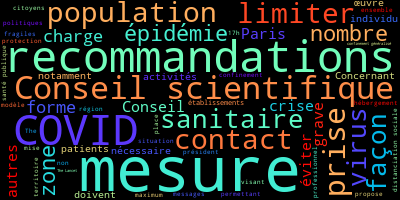

In [163]:
WC = wordcloud.WordCloud(
    stopwords=stop_words + additional_stopwords,
    background_color="black",
    colormap="rainbow",
).generate(df.Text.iloc[0])
im = WC.to_image()
im

avis_conseil_scientifique_16_mars_2020.pdf
285769.pdf
285587.pdf
284452.pdf
284119.pdf
283782.pdf
283476.pdf
283441.pdf
283288.pdf
283223.pdf
283222.pdf
283221.pdf
283220.pdf
282998.pdf
282890.pdf
282501.pdf
282486_0.pdf
282485.pdf
281906.pdf
281828.pdf
281363.pdf


C:\Users\romai\AppData\Local\Temp\ipykernel_12588\581811663.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


281331.pdf
281100.pdf
280818.pdf
280765.pdf
280714.pdf
280241.pdf
280143.pdf
279792.pdf
279739.pdf
279698.pdf
279649.pdf
279618.pdf
279509.pdf
avis-conseil-scientifique-29032021.pdf
279104.pdf
279027.pdf
278698.pdf
279091.pdf
278133.pdf
278080.pdf
277895.pdf
279087.pdf
277716.pdf
277471.pdf
277008.pdf
276897.pdf
276857.pdf
276509.pdf
276604.pdf
276128.pdf
275654_0.pdf
279086.pdf
279078.pdf
279076.pdf
279103.pdf
274596.pdf
274594.pdf
274444.pdf
274347_0.pdf
274589.pdf
274301.pdf
274178.pdf
274173.pdf
274082.pdf
274080.pdf
avis_conseil_scientifique_23_mars_2020.pdf
avis_conseil_scientifique_14_mars_2020.pdf
avis_conseil_scientifique_12_mars_2020.pdf


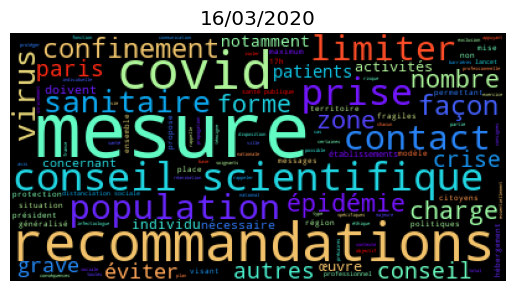

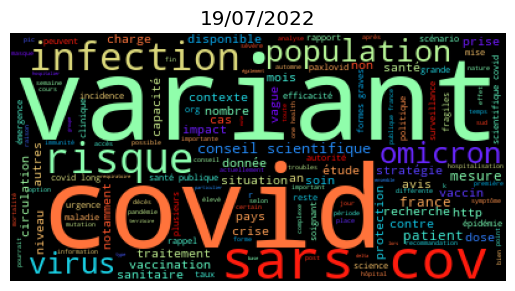

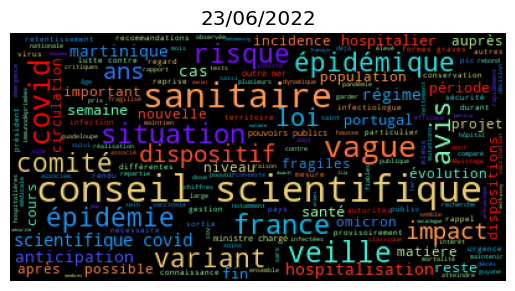

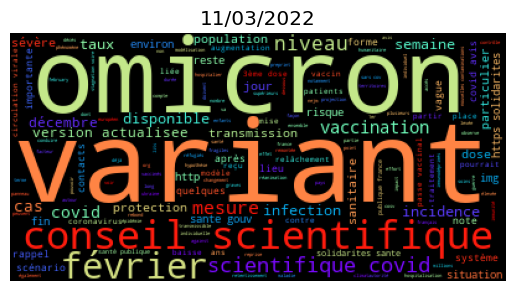

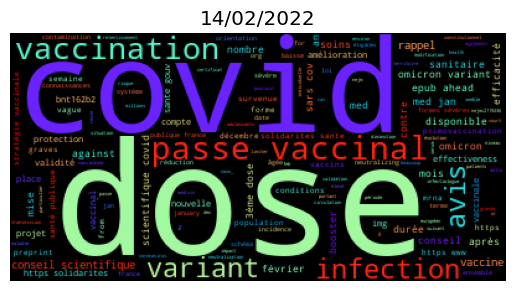

...

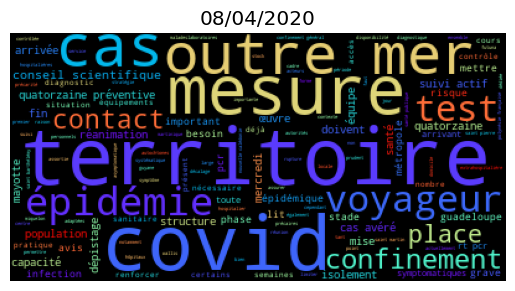

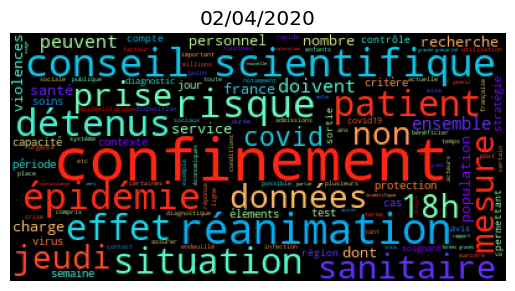

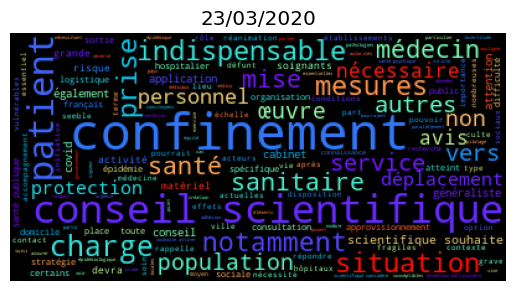

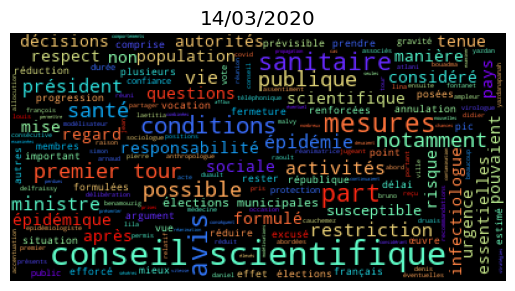

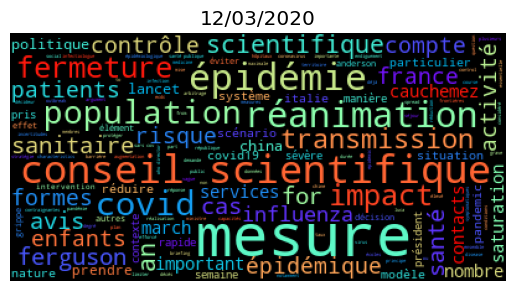

In [167]:
im = df.apply(get_wordcloud, axis=1)

In [168]:
df.Date.head

<bound method NDFrame.head of 0    2020-03-16
1    2022-07-19
2    2022-06-23
3    2022-03-11
4    2022-02-14
5    2022-02-08
6    2022-01-21
7    2022-01-19
8    2022-01-13
9    2021-12-26
10   2021-12-24
11   2021-12-22
12   2021-12-21
13   2021-12-16
14   2021-12-08
15   2021-11-20
16   2021-10-12
17   2021-10-12
18   2021-10-06
19   2021-10-05
20   2021-08-29
21   2021-08-20
22   2021-08-05
23   2021-07-16
24   2021-07-15
25   2021-07-06
26   2021-06-04
27   2021-05-24
28   2021-05-06
29   2021-05-03
30   2021-04-21
31   2021-04-23
32   2021-04-19
33   2021-04-16
34   2021-03-29
35   2021-03-11
36   2021-02-26
37   2021-02-12
38   2021-01-29
39   2021-01-12
40   2021-01-08
41   2020-12-22
42   2020-12-19
43   2020-12-12
44   2020-11-17
45   2020-10-28
46   2020-10-20
47   2020-10-19
48   2020-09-22
49   2020-09-12
50   2020-09-03
51   2020-07-27
52   2020-07-10
53   2020-07-09
54   2020-06-21
55   2020-06-14
56   2020-06-08
57   2020-06-08
58   2020-06-02
59   2020-05-18
60   2020-

In [172]:
len(txt)

2841989

In [171]:
txt.count("vaccin")

2330

In [182]:
def get_count(row, keyword, normalized=True):
    count = row.Text.lower().count(keyword.lower())
    if normalized:
        count = count / len(row.Text)
    return count

""
Date
2020-03-16
2022-07-19
2022-06-23
2022-03-11
2022-02-14


In [203]:
def get_counts(keywords, normalized=True):
    df_trend = pd.DataFrame()
    for keyword in keywords:
        df_trend[keyword] = df.apply(
            lambda x: get_count(x, keyword=keyword, normalized=normalized), axis=1
        )
    df_trend.index = df.Date
    return df_trend

In [217]:
def plot_trends(df_trend):
    fig, ax = plt.subplots(figsize=(12, 3))
    df_trend.resample("M").mean().plot(ax=ax, alpha=0.4, kind="area", stacked=True)
    ax.set_ylabel("Indice d'occurence")
    ax.set_title("Evolution de l'occurence relative des termes")
    return fig, ax

In [218]:
def analyse_trends(keywords, normalized=True):
    df_trend = get_counts(keywords, normalized=normalized)
    fig, ax = plot_trends(df_trend)
    return fig, ax

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

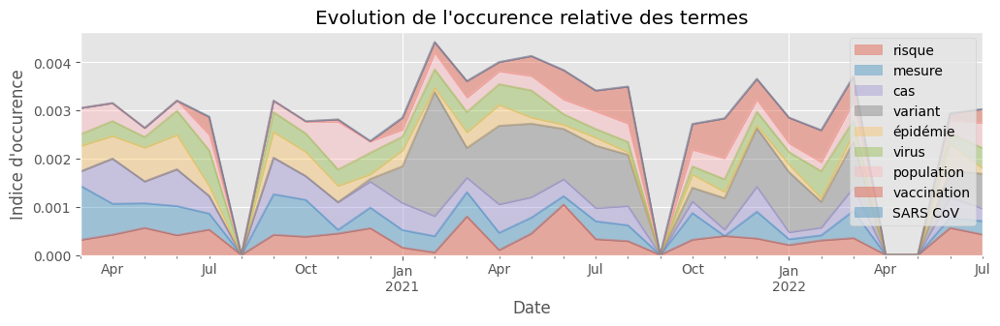

In [219]:
analyse_trends(keywords=df_words.index[1:10])

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

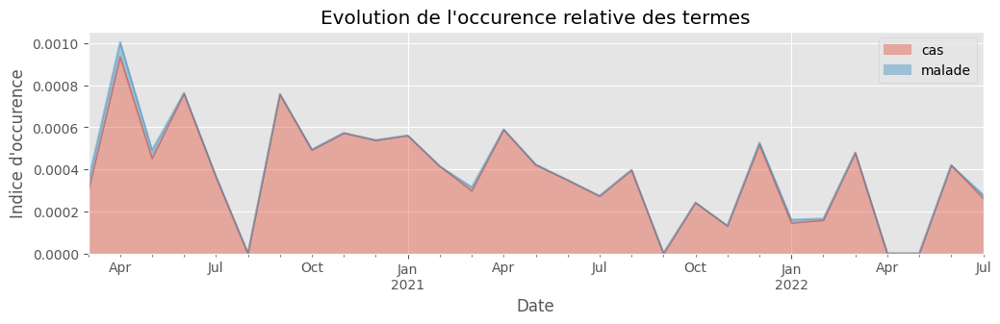

In [220]:
analyse_trends(keywords=["cas", "malade"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

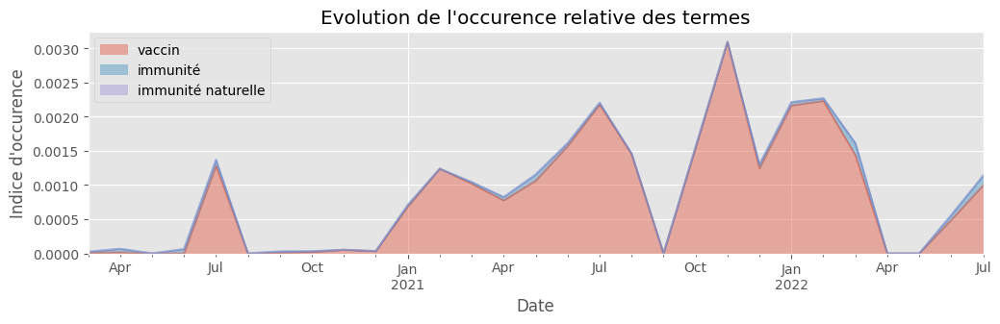

In [253]:
analyse_trends(keywords=["vaccin", "immunité", "immunité naturelle"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

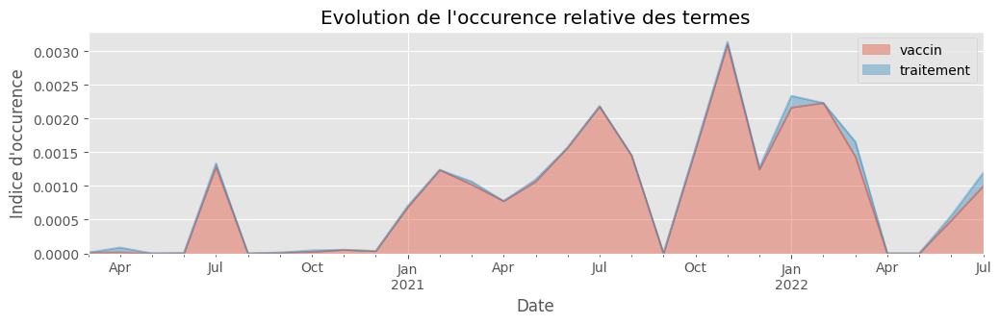

In [222]:
analyse_trends(keywords=["vaccin", "traitement"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

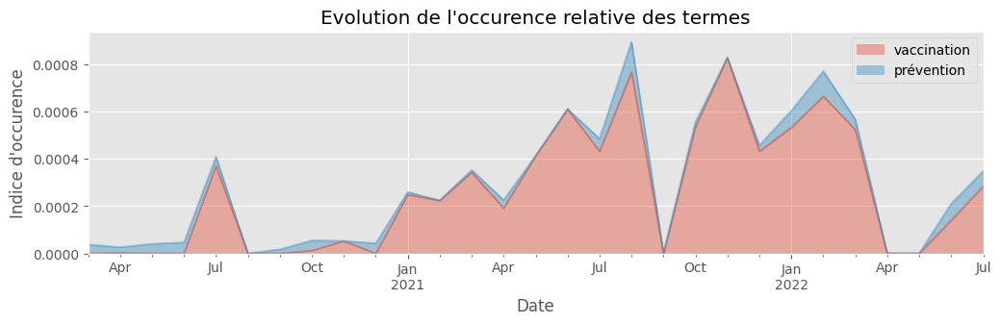

In [223]:
analyse_trends(keywords=["vaccination", "prévention"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

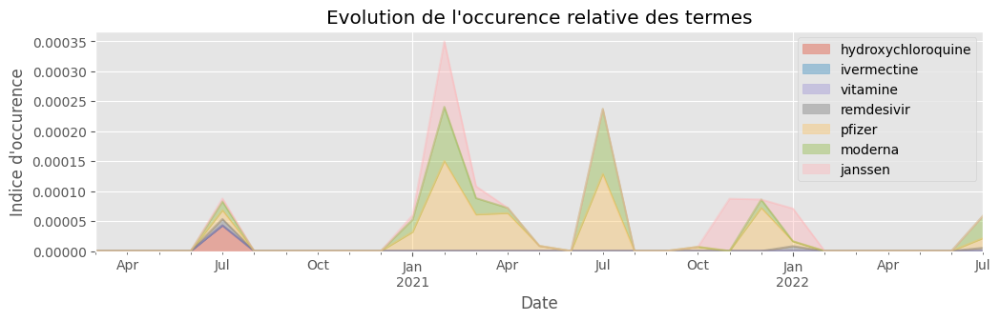

In [250]:
analyse_trends(
    keywords=[
        "hydroxychloroquine",
        "ivermectine",
        "vitamine",
        "remdesivir",
        "pfizer",
        "moderna",
        # "jonhson",
        "janssen",
    ],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

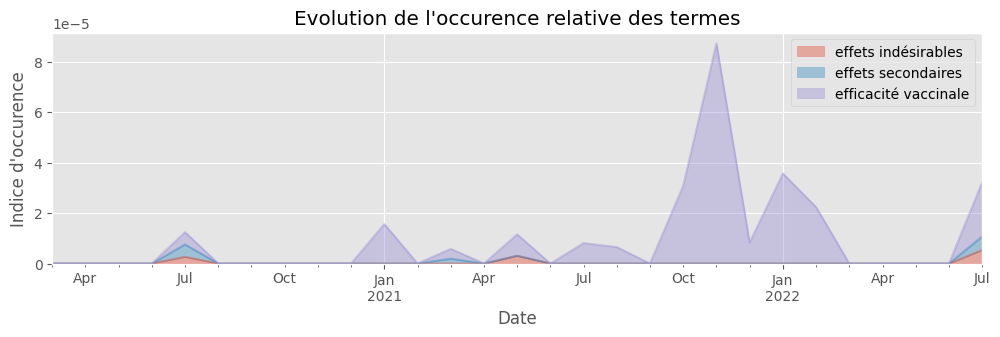

In [231]:
analyse_trends(
    keywords=["effets indésirables", "effets secondaires", "efficacité vaccinale"],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

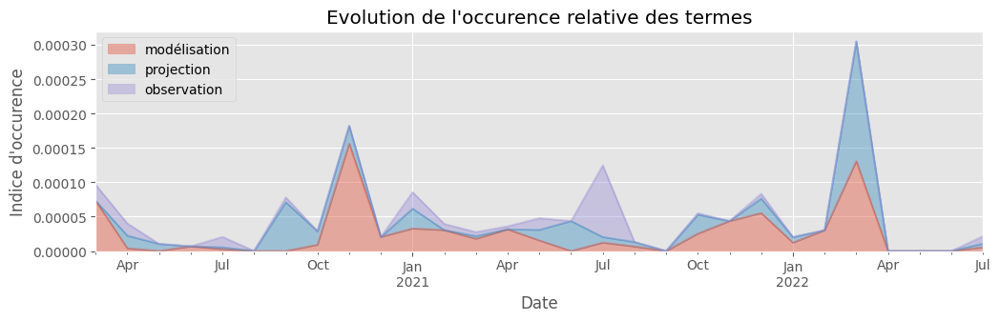

In [236]:
analyse_trends(
    keywords=["modélisation", "projection", "observation"],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

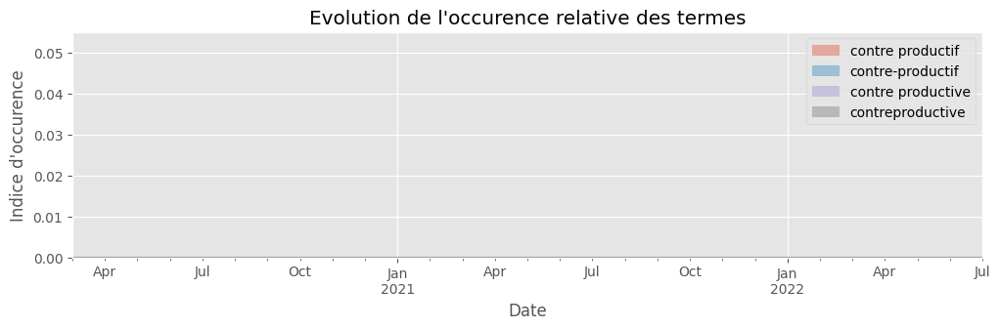

In [244]:
analyse_trends(
    keywords=[
        "contre productif",
        "contre-productif",
        "contre productive",
        "contreproductive",
    ],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

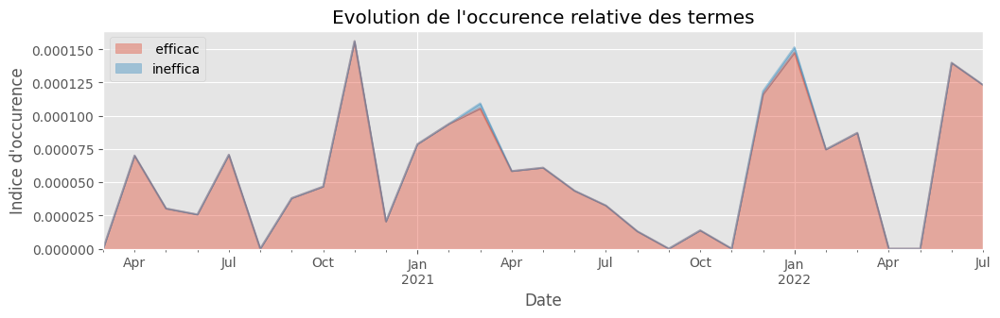

In [245]:
analyse_trends(
    keywords=[
        " efficac",
        "ineffica",
    ],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

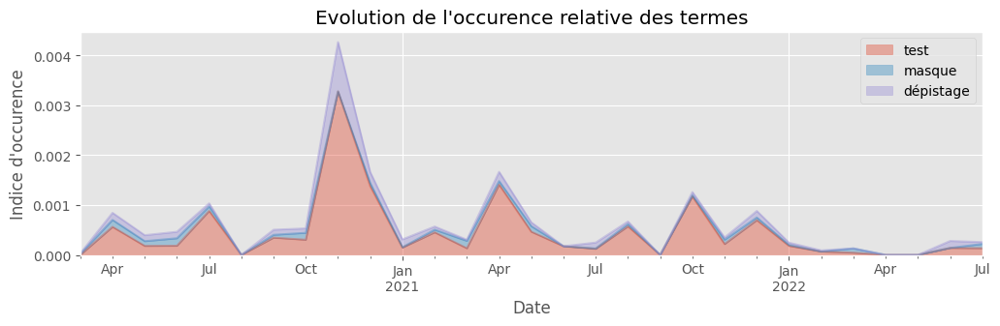

In [246]:
analyse_trends(
    keywords=[
        "test",
        "masque",
        "dépistage",
    ],
    normalized=True,
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

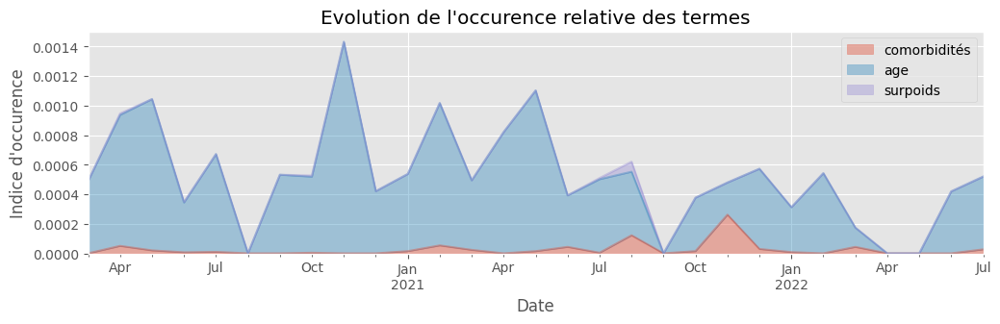

In [258]:
analyse_trends(keywords=["comorbidités", "age", "surpoids"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

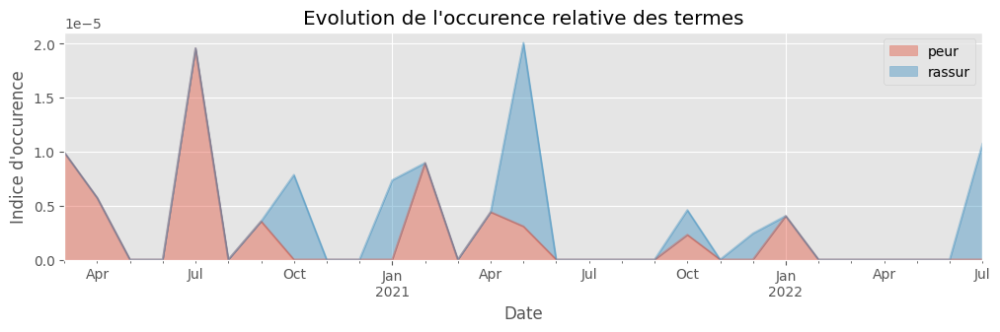

In [274]:
analyse_trends(keywords=["peur", "rassur"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

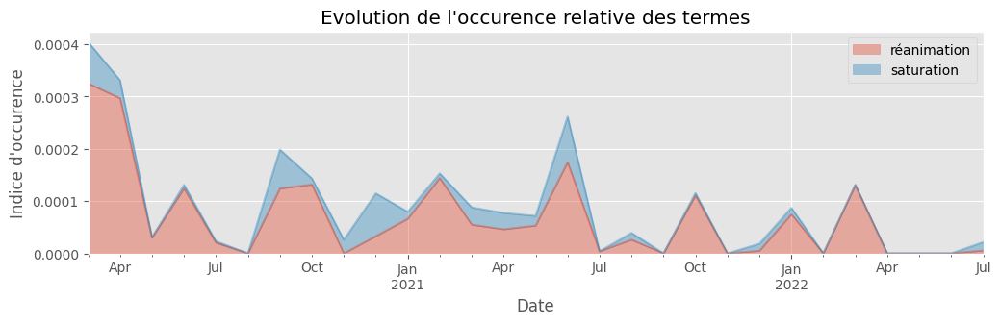

In [261]:
analyse_trends(keywords=["réanimation", "saturation"], normalized=True)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

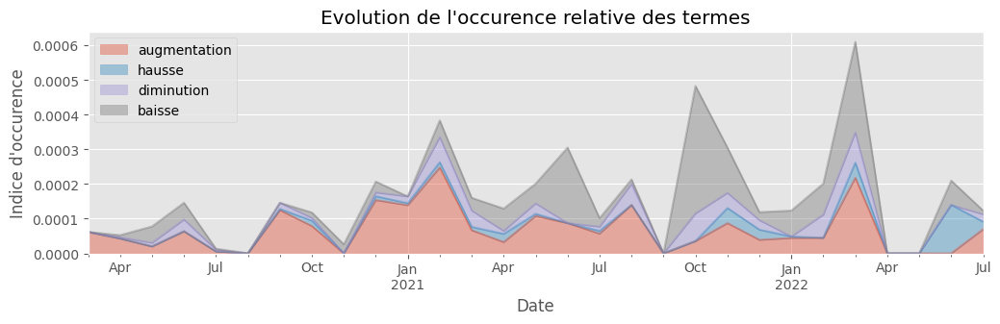

In [262]:
analyse_trends(
    keywords=["augmentation", "hausse", "diminution", "baisse"], normalized=True
)

(<Figure size 1200x300 with 1 Axes>,
 <Axes: title={'center': "Evolution de l'occurence relative des termes"}, xlabel='Date', ylabel="Indice d'occurence">)

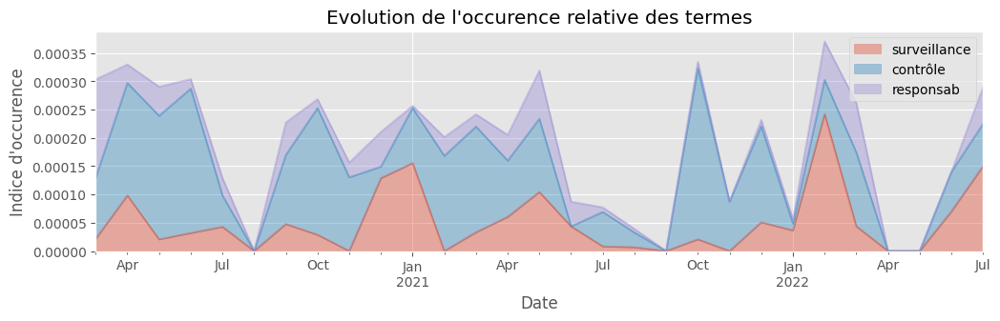

In [275]:
analyse_trends(keywords=["surveillance", "contrôle", "responsab"], normalized=True)

In [238]:
df_words

,score
Conseil scientifique,1.000000
risque,0.759485
mesure,0.729675
cas,0.676152
variant,0.612466
épidémie,0.610434
virus,0.582656
population,0.565041
vaccination,0.480352
SARS CoV,0.478997


In [266]:
df.shape

(69, 5)